# **COMPETENCIA KAGGLE**

**IMPORTO LIBRERIAS**

In [3]:
import pandas as pd
import os
import numpy as np

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error

import xgboost as xgb
from xgboost import plot_importance, plot_tree

import os
from datetime import datetime
pd.set_option('display.max_columns', None)


In [4]:


# Definir la ruta base
ruta_base = r'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3\Datasets Competencia/1ERA COMPETENCIA'

# Leer los archivos
sell_in_path = os.path.join(ruta_base, 'sell-in.txt')
tb_productos_path = os.path.join(ruta_base, 'tb_productos.txt')
tb_stocks_path = os.path.join(ruta_base, 'tb_stocks.txt')
tb_productos_descripcion_path = os.path.join(ruta_base, 'tb_productos_descripcion.txt')

ruta_archivo = ruta_base + '/productos_predecir.xlsx'
productos_predecir = pd.read_excel(ruta_archivo)



sell_in = pd.read_csv(sell_in_path, sep='\t')  # Cambia 'sep' si el separador es diferente
tb_productos = pd.read_csv(tb_productos_path, sep='\t')
tb_productos_descripcion = pd.read_csv(tb_productos_descripcion_path, sep='\t')

tb_stocks = pd.read_csv(tb_stocks_path, sep='\t')

In [5]:
productos_predecir.head()

,product_id
0,20001
1,20002
2,20003
3,20004
4,20005


In [6]:
sell_in.head(5)

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn
0,201701,10234,20524,0,2,0.05300,0.05300
1,201701,10032,20524,0,1,0.13628,0.13628
2,201701,10217,20524,0,1,0.03028,0.03028
3,201701,10125,20524,0,1,0.02271,0.02271
4,201701,10012,20524,0,11,1.54452,1.54452


In [7]:
tb_productos.head(5)

,cat1,cat2,cat3,brand,sku_size,product_id
0,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20280
1,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20180
2,HC,ROPA LAVADO,Liquido,LIMPIEX,120,20332
3,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20222
4,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20288


In [8]:
tb_productos_descripcion.head()

,cat1,cat2,cat3,brand,sku_size,product_id,descripcion
0,FOODS,ADEREZOS,Aji Picante,NATURA,240,20609,Salsa Aji Picante
1,FOODS,ADEREZOS,Barbacoa,NATURA,250,20266,Salsa Barbacoa
2,FOODS,ADEREZOS,Barbacoa,NATURA,400,20325,Salsa Barbacoa
3,FOODS,ADEREZOS,Barbacoa,NATURA,500,20503,Salsa Barbacoa
4,FOODS,ADEREZOS,Chimichurri,NATURA,350,20797,Chimichurri


#### **sell_in**

In [9]:
sell_in.groupby('periodo')['tn'].sum().reset_index()

,periodo,tn
0,201701,34057.31784
1,201702,34568.65311
2,201703,46040.59636
3,201704,39625.52445
4,201705,45579.63296
5,201706,44853.30050
6,201707,36925.20583
7,201708,40206.38305
8,201709,47934.65801
9,201710,49750.29319


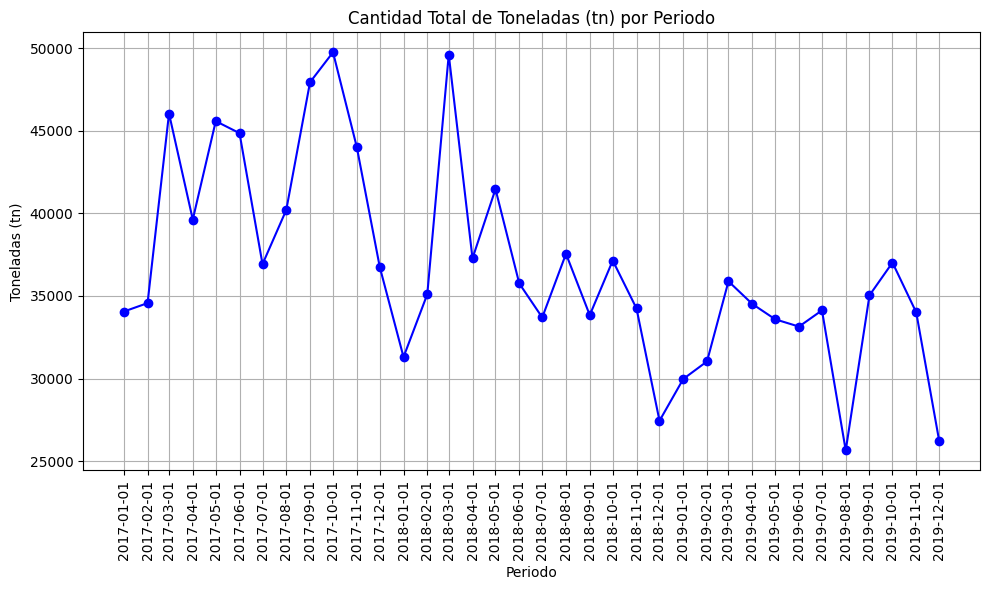

In [10]:

# Cargar el DataFrame desde el archivo

# Calcular la cantidad total de toneladas (tn) por periodo
total_tn_por_periodo = sell_in.groupby('periodo')['tn'].sum().reset_index()

# Convertir la columna 'periodo' a tipo datetime para el gráfico de línea
total_tn_por_periodo['periodo'] = pd.to_datetime(total_tn_por_periodo['periodo'], format='%Y%m')

# Crear el gráfico de línea
plt.figure(figsize=(10, 6))
plt.plot(total_tn_por_periodo['periodo'], total_tn_por_periodo['tn'], marker='o', linestyle='-', color='b')
plt.title('Cantidad Total de Toneladas (tn) por Periodo')
plt.xlabel('Periodo')
plt.ylabel('Toneladas (tn)')
plt.grid(True)
#plt.xticks(rotation=45)
#plt.tight_layout()

# Mostrar el gráfico
#plt.show()
# Ajustar las etiquetas del eje x para que estén en formato vertical
plt.xticks(rotation=90)

# Asegurar que todas las etiquetas se muestren
plt.gca().set_xticks(total_tn_por_periodo['periodo'])

# Ajustar el diseño para evitar recortes
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [11]:
sell_in.shape

(2945818, 7)

In [12]:
sell_in['diferencia_tn'] = sell_in['cust_request_tn'] - sell_in['tn']


In [13]:
sell_in.head(15)

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,diferencia_tn
0,201701,10234,20524,0,2,0.05300,0.05300,0.0
1,201701,10032,20524,0,1,0.13628,0.13628,0.0
2,201701,10217,20524,0,1,0.03028,0.03028,0.0
3,201701,10125,20524,0,1,0.02271,0.02271,0.0
4,201701,10012,20524,0,11,1.54452,1.54452,0.0
5,201701,10080,20524,0,1,0.01514,0.01514,0.0
6,201701,10015,20524,0,4,0.10600,0.10600,0.0
7,201701,10062,20524,0,1,0.18928,0.18928,0.0
8,201701,10159,20524,0,3,0.02271,0.02271,0.0
9,201701,10183,20524,0,1,0.01514,0.01514,0.0


In [14]:
sell_in.describe()

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,diferencia_tn
count,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06
mean,2.018017e+05,1.017148e+04,2.042787e+04,1.155163e-02,2.148753e+00,4.593203e-01,4.497863e-01,9.534001e-03
std,8.142115e+01,1.421467e+02,3.124612e+02,1.068559e-01,3.571552e+00,3.222836e+00,3.108355e+00,3.760922e-01
min,2.017010e+05,1.000100e+04,2.000100e+04,0.000000e+00,1.000000e+00,1.000000e-04,1.000000e-04,-1.519277e+01
25%,2.017090e+05,1.005300e+04,2.016100e+04,0.000000e+00,1.000000e+00,1.029000e-02,1.027000e-02,0.000000e+00
50%,2.018050e+05,1.013300e+04,2.036600e+04,0.000000e+00,1.000000e+00,3.931000e-02,3.931000e-02,0.000000e+00
75%,2.019030e+05,1.026700e+04,2.065400e+04,0.000000e+00,2.000000e+00,1.572500e-01,1.572500e-01,0.000000e+00
max,2.019120e+05,1.063700e+04,2.129900e+04,1.000000e+00,9.200000e+01,5.515614e+02,5.478785e+02,1.405797e+02


In [15]:
sell_in_group = sell_in.groupby(['periodo', 'product_id']).agg({
    'cust_request_tn': 'sum',
    'tn': 'sum',
    'diferencia_tn': 'sum'
}).reset_index()

In [16]:
sell_in_group.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn
0,201701,20001,937.72717,934.77222,2.95495
1,201701,20002,555.18654,550.15707,5.02947
2,201701,20003,1067.81543,1063.45835,4.35708
3,201701,20004,569.37394,555.91614,13.45780
4,201701,20005,494.60084,494.27011,0.33073


In [17]:

#sell_in_group2 = pd.merge(sell_in_group, tb_stocks[['periodo', 'product_id', 'stock_final']], on=['periodo', 'product_id'], how='left')



In [18]:
#sell_in_group2.tail()

#### **tb_productos**

In [19]:
tb_productos.shape

(1262, 6)

In [20]:
tb_productos['cat2'].nunique()


15

In [21]:
tb_productos.groupby(['cat2', 'cat3']).size().nunique()


28

#### **tb_productos_descripcion**

In [22]:
tb_productos_descripcion.head()

,cat1,cat2,cat3,brand,sku_size,product_id,descripcion
0,FOODS,ADEREZOS,Aji Picante,NATURA,240,20609,Salsa Aji Picante
1,FOODS,ADEREZOS,Barbacoa,NATURA,250,20266,Salsa Barbacoa
2,FOODS,ADEREZOS,Barbacoa,NATURA,400,20325,Salsa Barbacoa
3,FOODS,ADEREZOS,Barbacoa,NATURA,500,20503,Salsa Barbacoa
4,FOODS,ADEREZOS,Chimichurri,NATURA,350,20797,Chimichurri


In [23]:
tb_productos_descripcion.drop_duplicates(subset=['cat1', 'cat2', 'cat3', 'brand', 'descripcion']).shape[0]



837

In [24]:
tb_productos_descripcion.shape

(1251, 7)

In [25]:
tb_productos_descripcion['cat2'].nunique()


15

#### **tb_stocks**


In [26]:
tb_stocks.head(10)

,periodo,product_id,stock_final
0,201810,20524,1.61267
1,201810,20311,2.93657
2,201810,20654,6.83269
3,201810,21005,1.01338
4,201810,20974,0.34595
5,201810,20828,10.51140
6,201810,20941,1.49926
7,201810,20803,0.86351
8,201810,20781,3.71171
9,201810,20638,36.99762


In [27]:
tb_stocks.shape

(13691, 3)

#### **productos_predecir**

In [28]:
productos_predecir.head()

,product_id
0,20001
1,20002
2,20003
3,20004
4,20005


In [29]:
productos_predecir.count()

product_id    780
dtype: int64

#### **Combinacion de sell in y de productos_descripcion**

In [30]:
sell_in_productos = pd.merge(sell_in_group, tb_productos_descripcion,  on='product_id', how='left')

In [31]:
sell_in_productos.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [32]:
sell_in.shape

(2945818, 8)

In [33]:
sell_in_group.shape

(31243, 5)

In [34]:
sell_in_productos.shape

(31243, 11)

In [35]:
sell_in_productos.isna().sum()

periodo              0
product_id           0
cust_request_tn      0
tn                   0
diferencia_tn        0
cat1               229
cat2               229
cat3               229
brand              229
sku_size           229
descripcion        229
dtype: int64

In [36]:
sell_in_productos[sell_in_productos['cat1'].isna()].tail()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
28404,201909,21228,0.07987,0.07987,0.0,NaN,NaN,NaN,NaN,NaN,NaN
29164,201910,20918,16.08149,16.08149,0.0,NaN,NaN,NaN,NaN,NaN,NaN
29318,201910,21169,9.00356,9.00356,0.0,NaN,NaN,NaN,NaN,NaN,NaN
29351,201910,21228,0.06480,0.06480,0.0,NaN,NaN,NaN,NaN,NaN,NaN
30291,201911,21228,0.05425,0.05425,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
sell_in_productos.describe()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size
count,31243.000000,31243.000000,31243.000000,31243.000000,31243.000000,31014.000000
mean,201810.415773,20532.624236,43.308070,42.409134,0.898935,477.782711
std,81.679451,345.827573,113.558671,109.789323,5.373795,884.966316
min,201701.000000,20001.000000,0.000640,0.000440,-14.346800,1.000000
25%,201710.000000,20237.000000,2.309595,2.300625,0.000000,90.000000
50%,201807.000000,20491.000000,9.827020,9.781470,0.000000,250.000000
75%,201904.000000,20807.000000,30.197970,29.956800,0.003390,475.000000
max,201912.000000,21299.000000,2423.708810,2295.198320,190.704550,10000.000000


Lo filtro por los 780 productos a predecir:

#### **Filtro por los productos a predecir**

In [38]:
sell_in_productos.describe()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size
count,31243.000000,31243.000000,31243.000000,31243.000000,31243.000000,31014.000000
mean,201810.415773,20532.624236,43.308070,42.409134,0.898935,477.782711
std,81.679451,345.827573,113.558671,109.789323,5.373795,884.966316
min,201701.000000,20001.000000,0.000640,0.000440,-14.346800,1.000000
25%,201710.000000,20237.000000,2.309595,2.300625,0.000000,90.000000
50%,201807.000000,20491.000000,9.827020,9.781470,0.000000,250.000000
75%,201904.000000,20807.000000,30.197970,29.956800,0.003390,475.000000
max,201912.000000,21299.000000,2423.708810,2295.198320,190.704550,10000.000000


In [39]:
sell_in_productos = sell_in_productos[sell_in_productos['product_id'].isin(productos_predecir['product_id'])]


In [108]:
sell_in_productos.shape

(22349, 11)

In [41]:
sell_in_productos.isna().sum()

periodo            0
product_id         0
cust_request_tn    0
tn                 0
diferencia_tn      0
cat1               0
cat2               0
cat3               0
brand              0
sku_size           0
descripcion        0
dtype: int64

Se soluciono el problemas de los NA

#### **Top 25 clientes**

Chequeo los mayores clientes del año 2019:

In [42]:
# Lista de periodos deseados
periodos = [201901, 201902, 201903, 201904, 201905, 201906, 201907, 201908, 201909, 201910, 201911, 201912]

# Filtrar las filas por los periodos deseados
filtro_periodos = sell_in[sell_in['periodo'].isin(periodos)]

# Agrupar por "customer_id" y sumarizar "tn"
sell_in_clientes = filtro_periodos.groupby('customer_id')['tn'].sum().reset_index()

sell_in_clientes = filtro_periodos.groupby('customer_id')['tn'].sum().reset_index()
sell_in_clientes.head()

,customer_id,tn
0,10001,33685.89001
1,10002,25948.00375
2,10003,20514.40695
3,10004,15890.07730
4,10005,14958.13439


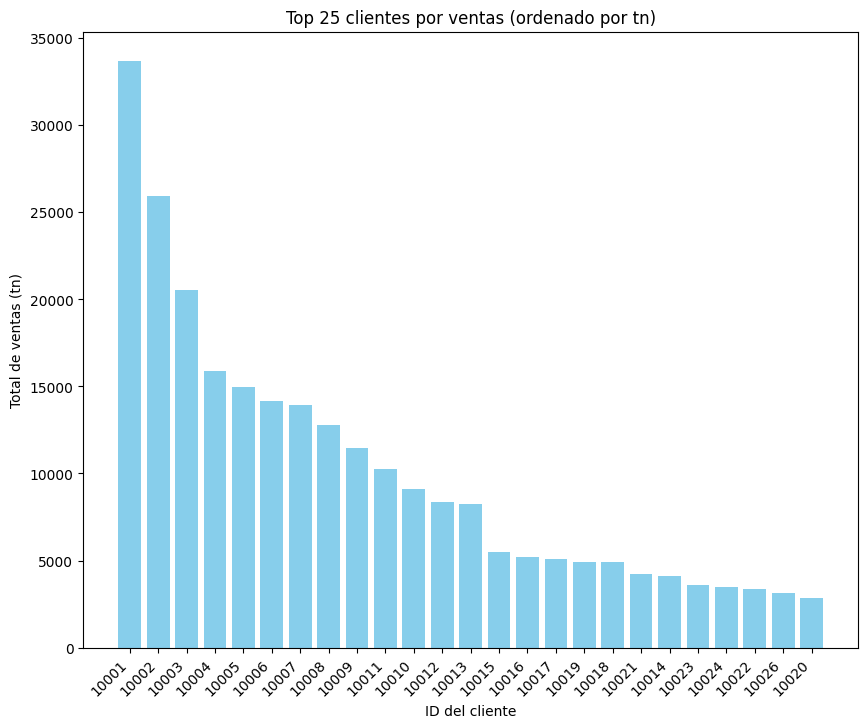

In [43]:
# Ordenar los clientes por la suma de 'tn' de mayor a menor y seleccionar los top 25
top_25_clientes = sell_in_clientes.sort_values(by='tn', ascending=False).head(25)

top_25_clientes['customer_id'] = top_25_clientes['customer_id'].astype(str)

# Crear el gráfico de barras ordenado
plt.figure(figsize=(10, 8))
plt.bar(top_25_clientes['customer_id'], top_25_clientes['tn'], color='skyblue')
plt.xlabel('ID del cliente')
plt.ylabel('Total de ventas (tn)')
plt.title('Top 25 clientes por ventas (ordenado por tn)')
plt.xticks(rotation=45, ha='right')  # Rotar los IDs de cliente para mejor legibilidad
plt.gca()  # Invertir el eje y para ordenar de mayor a menor
plt.show()

#### **Variables de Prophet**

In [44]:
prophet_data = "prophet_fe_data.csv"
df_prophet = pd.read_csv(prophet_data, decimal='.', delimiter=',', encoding='utf-8')

In [45]:
columnas= ['trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper', 
                          'additive_terms', 'additive_terms_lower', 'additive_terms_upper', 
                          'yearly', 'yearly_lower', 'yearly_upper']

for columna in columnas:
    df_prophet[columna] = df_prophet[columna].apply(lambda x: max(x, 0))

In [46]:
df_prophet['periodo'] = pd.to_datetime(df_prophet['ds'], format='%Y-%m-%d')
df_prophet['periodo'] = df_prophet['periodo'].dt.strftime('%Y%m').astype(int)

In [47]:
columnas_seleccionadas= ['periodo', 'product_id', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper', 
                          'additive_terms', 'additive_terms_lower', 'additive_terms_upper', 
                          'yearly', 'yearly_lower', 'yearly_upper']

df_prophet = df_prophet[columnas_seleccionadas]

In [48]:
df_prophet.head()

,periodo,product_id,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper
0,201701,20001,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,201702,20001,1262.235256,552.200472,1185.622572,1262.235256,1262.235256,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,201703,20001,1271.645129,1169.577591,1836.598993,1271.645129,1271.645129,241.601638,241.601638,241.601638,241.601638,241.601638,241.601638
3,201704,20001,1280.751458,743.639264,1375.402442,1280.751458,1280.751458,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,201705,20001,1290.161331,1094.231747,1724.686243,1290.161331,1290.161331,118.402960,118.402960,118.402960,118.402960,118.402960,118.402960


In [49]:
sell_in_productos_fe  = sell_in_productos.merge(df_prophet, on=['product_id', 'periodo'], how='left')
sell_in_productos_fe.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado,716.346696,430.359980,954.448759,716.346696,716.346696,0.0,0.0,0.0,0.0,0.0,0.0
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC,1082.529115,843.072381,1270.148191,1082.529115,1082.529115,0.0,0.0,0.0,0.0,0.0,0.0
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC,762.622854,381.831960,748.654537,762.622854,762.622854,0.0,0.0,0.0,0.0,0.0,0.0
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC,678.688034,325.704570,635.328455,678.688034,678.688034,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
sell_in_productos_fe.dtypes

periodo                   int64
product_id                int64
cust_request_tn         float64
tn                      float64
diferencia_tn           float64
cat1                     object
cat2                     object
cat3                     object
brand                    object
sku_size                float64
descripcion              object
trend                   float64
yhat_lower              float64
yhat_upper              float64
trend_lower             float64
trend_upper             float64
additive_terms          float64
additive_terms_lower    float64
additive_terms_upper    float64
yearly                  float64
yearly_lower            float64
yearly_upper            float64
dtype: object

In [51]:
#sell_in_productos_fe['periodo'] = pd.to_datetime(sell_in_productos_fe['periodo'], format='%Y%m')


#### **Target**

In [52]:
### Agrego el target
sell_in_productos_fe['target'] = sell_in_productos_fe.groupby('product_id')['tn'].shift(-2)

In [53]:
sell_in_productos_fe.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,1303.35771
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado,716.346696,430.359980,954.448759,716.346696,716.346696,0.0,0.0,0.0,0.0,0.0,0.0,834.73521
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC,1082.529115,843.072381,1270.148191,1082.529115,1082.529115,0.0,0.0,0.0,0.0,0.0,0.0,917.16548
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC,762.622854,381.831960,748.654537,762.622854,762.622854,0.0,0.0,0.0,0.0,0.0,0.0,489.91328
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC,678.688034,325.704570,635.328455,678.688034,678.688034,0.0,0.0,0.0,0.0,0.0,0.0,563.89955


#### Estandarizo cada serie

In [54]:

# Copiar el DataFrame original
sell_in_trans = sell_in_productos_fe.copy()

# Seleccionar las columnas numéricas
columnas_numericas = sell_in_productos_fe.select_dtypes(include=['float64', 'int64']).columns
columnas_numericas = columnas_numericas.drop(['periodo', 'product_id', 'target'])

# Inicializar el escalador
scaler = StandardScaler()

# Ajustar y transformar las columnas numéricas en los datos de entrenamiento
sell_in_trans[columnas_numericas] = scaler.fit_transform(sell_in_trans[columnas_numericas])




In [55]:
columnas_numericas

Index(['cust_request_tn', 'tn', 'diferencia_tn', 'sku_size', 'trend',
       'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'yearly', 'yearly_lower', 'yearly_upper'],
      dtype='object')

In [56]:
sell_in_trans.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,6.848606,7.075562,0.292747,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,9.899131,6.611174,8.209206,9.899131,9.899131,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1303.35771
1,201701,20002,3.892854,3.998976,0.626139,HC,ROPA LAVADO,Liquido,LIMPIEX,3.070631,Maquina 1er lavado,5.479615,4.192876,5.745802,5.479615,5.479615,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,834.73521
2,201701,20003,7.853751,8.104939,0.518080,FOODS,ADEREZOS,Mayonesa,NATURA,0.032917,Regular sin TACC,8.491117,8.574359,7.785838,8.491117,8.491117,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,917.16548
3,201701,20004,4.002474,4.045043,1.980639,FOODS,ADEREZOS,Mayonesa,NATURA,-0.249801,Regular sin TACC,5.860192,3.677687,4.415968,5.860192,5.860192,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,489.91328
4,201701,20005,3.424730,3.551929,-0.128987,FOODS,ADEREZOS,Mayonesa,NATURA,-0.394168,Regular sin TACC,5.169908,3.081821,3.683659,5.169908,5.169908,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,563.89955


In [57]:
sell_in_productos_fe.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,1303.35771
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado,716.346696,430.359980,954.448759,716.346696,716.346696,0.0,0.0,0.0,0.0,0.0,0.0,834.73521
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC,1082.529115,843.072381,1270.148191,1082.529115,1082.529115,0.0,0.0,0.0,0.0,0.0,0.0,917.16548
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC,762.622854,381.831960,748.654537,762.622854,762.622854,0.0,0.0,0.0,0.0,0.0,0.0,489.91328
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC,678.688034,325.704570,635.328455,678.688034,678.688034,0.0,0.0,0.0,0.0,0.0,0.0,563.89955


In [58]:
df = sell_in_trans.copy()
df = df.sort_values(by=['product_id', 'periodo'])

# Lags (meses)
lags = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for lag in lags:
    df[f'lag_{lag}'] = df.groupby('product_id')['tn'].shift(lag)

# Delta lags (meses)
for lag in lags:    
    df[f'delta_lag_{lag}'] = df[f'lag_{lag}'] - df[f'lag_{lag}'].shift(1)
    
# Medias moviles
for window in lags:
    df[f'moving_avg_{window}'] = df.groupby(['product_id'])['tn'].transform(lambda x: x.shift().rolling(window=window, min_periods=window).mean())
    
# Ratios
df['ratio_3'] = df['tn'] / df['moving_avg_3']
df['ratio_6'] = df['tn'] / df['moving_avg_6']

for i in range(2, 13):
    df[f'max_{i}_months'] = (df['tn'] == df['tn'].rolling(window=i, min_periods=i).max()).astype(int)

In [59]:
import calendar


In [60]:
# Quarter
def fiscal_quarter(month):
    if month in [7, 8, 9]:
        return 1
    elif month in [10, 11, 12]:
        return 2
    elif month in [1, 2, 3]:
        return 3
    else:
        return 4

# Temporales

# Asegurarse de que 'periodo' esté en formato de cadena
df['periodo'] = df['periodo'].astype(str)

# Extraer el año de los primeros 4 caracteres y convertirlo a entero
df['Year'] = df['periodo'].str[:4].astype(int)
df['Month'] = df['periodo'].str[4:6].astype(int)

# Aplicar la función fiscal_quarter para obtener el trimestre fiscal
df['Q'] = df['Month'].apply(fiscal_quarter)

# Calcular el número de días en cada mes
df['Days_Month'] = df.apply(lambda row: calendar.monthrange(row['Year'], row['Month'])[1], axis=1)

# Convertir 'periodo' a un objeto datetime
df['periodo'] = pd.to_datetime(df['periodo'], format='%Y%m')

# Calcular las características de continuidad
df['month_sin'] = np.sin(2 * np.pi * df['periodo'].dt.month / 12)
df['month_cos'] = np.cos(2 * np.pi * df['periodo'].dt.month / 12)

In [61]:
df.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos
0,2017-01-01,20001,6.848606,7.075562,0.292747,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,9.899131,6.611174,8.209206,9.899131,9.899131,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1303.35771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.500000,8.660254e-01
496,2017-02-01,20001,6.044995,5.981633,5.556051,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,9.969029,5.486372,7.239637,9.969029,9.969029,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1069.96130,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,2,3,28,0.866025,5.000000e-01
994,2017-03-01,20001,9.885327,10.023925,4.219537,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.046417,12.040640,11.446220,10.046417,10.046417,6.040720,6.040720,6.040720,6.040720,6.040720,6.040720,1502.20132,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.981633,6.528598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,0,0,0,0,0,0,0,2017,3,3,31,1.000000,6.123234e-17
1495,2017-04-01,20001,8.356978,8.156957,9.939738,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.121308,7.518746,8.465987,10.121308,10.121308,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1520.06539,10.023925,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.042292,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.023925,8.002779,7.693707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.060212,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,4,4,30,0.866025,-5.000000e-01
1995,2017-05-01,20001,11.584742,11.614501,7.610281,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.198695,11.240745,10.723045,10.198695,10.198695,2.872371,2.872371,2.872371,2.872371,2.872371,2.872371,1030.67391,8.156957,10.023925,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.866968,4.042292,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.156957,9.090441,8.054172,7.809519,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.442048,NaN,1,1,1,1,0,0,0,0,0,0,0,2017,5,4,31,0.500000,-8.660254e-01


In [62]:
df_20001 = df.query("product_id == 20001")
df_20001.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos
0,2017-01-01,20001,6.848606,7.075562,0.292747,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,9.899131,6.611174,8.209206,9.899131,9.899131,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1303.35771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.500000,8.660254e-01
496,2017-02-01,20001,6.044995,5.981633,5.556051,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,9.969029,5.486372,7.239637,9.969029,9.969029,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1069.96130,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,2,3,28,0.866025,5.000000e-01
994,2017-03-01,20001,9.885327,10.023925,4.219537,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.046417,12.040640,11.446220,10.046417,10.046417,6.040720,6.040720,6.040720,6.040720,6.040720,6.040720,1502.20132,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.981633,6.528598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,0,0,0,0,0,0,0,2017,3,3,31,1.000000,6.123234e-17
1495,2017-04-01,20001,8.356978,8.156957,9.939738,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.121308,7.518746,8.465987,10.121308,10.121308,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,-0.172645,1520.06539,10.023925,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.042292,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.023925,8.002779,7.693707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.060212,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,4,4,30,0.866025,-5.000000e-01
1995,2017-05-01,20001,11.584742,11.614501,7.610281,HC,ROPA LAVADO,Liquido,ARIEL,3.070631,genoma,10.198695,11.240745,10.723045,10.198695,10.198695,2.872371,2.872371,2.872371,2.872371,2.872371,2.872371,1030.67391,8.156957,10.023925,5.981633,7.075562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.866968,4.042292,-1.093929,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.156957,9.090441,8.054172,7.809519,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.442048,NaN,1,1,1,1,0,0,0,0,0,0,0,2017,5,4,31,0.500000,-8.660254e-01


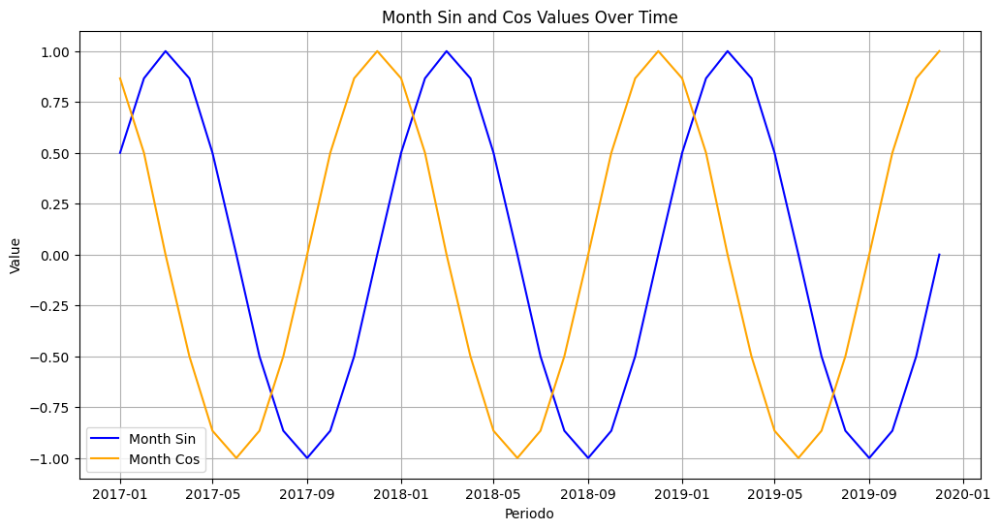

In [63]:
# Plotear las columnas 'periodo', 'month_sin' y 'month_cos'
plt.figure(figsize=(12, 6))
plt.plot(df_20001['periodo'], df_20001['month_sin'], label='Month Sin', color='blue')
plt.plot(df_20001['periodo'], df_20001['month_cos'], label='Month Cos', color='orange')

plt.xlabel('Periodo')
plt.ylabel('Value')
plt.title('Month Sin and Cos Values Over Time')
plt.legend()
plt.grid(True)
plt.show()

In [64]:
df.isna().sum()

periodo            0
product_id         0
cust_request_tn    0
tn                 0
diferencia_tn      0
                  ..
Month              0
Q                  0
Days_Month         0
month_sin          0
month_cos          0
Length: 78, dtype: int64

In [65]:
# Definir el nombre del archivo de salida
#nombre_archivo = 'suma_tn_por_product_id.xlsx'

# Guardar el DataFrame en Excel
#ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/' + nombre_archivo
#suma_tn_por_product_id.to_excel(ruta_salida, index=False)

#### **One hot**

In [66]:
df = pd.get_dummies(df, columns=['cat1', 'cat2', 'cat3', 'brand', 'descripcion'])


In [67]:
df.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Galletitas,cat3_Gel,cat3_Hierbas,cat3_INDUSTRIAL,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PISOS,cat3_POST WASH,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_GOMINA,brand_HARINAMA,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,descripcion_Aroma 8,descripcion_Arroz Cuatro Quesos,descripcion_Arroz hortalizas,descripcion_Avena,descripcion_Aventura,descripcion_Azul,descripcion_BB,descripcion_Baja Espuma,descripcion_Baño Biodegradable,descripcion_BioEnergético Industrial,descripcion_BioEnergético doypack,descripcion_BioEnergético gatillo,descripcion_Biodegradab

In [68]:
df.dtypes

periodo                      datetime64[ns]
product_id                            int64
cust_request_tn                     float64
tn                                  float64
diferencia_tn                       float64
                                  ...      
descripcion_ropa negra                 bool
descripcion_rulos vitales              bool
descripcion_sport                      bool
descripcion_sport extremo              bool
descripcion_trigo                      bool
Length: 638, dtype: object

#### **XGBoost con semillerio**

##### Prueba 1- Entreno con todos los periodos, valido con 201910, para predecir 201912

In [69]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import optuna

# Filtrar datos para entrenamiento y validación
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']



#scaler2 = StandardScaler()

#y_train["target"] = scaler2.fit_transform(df_train['target'].values.reshape(-1,1))

# Definir función de objetivo para la optimización de hyperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    return rmse

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [0, 1, 2, 3, 4]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de validación
val_rmse = mean_squared_error(y_val, final_prediction, squared=False)
print("RMSE en conjunto de validación (promedio de semillas):", val_rmse)


[I 2024-06-23 10:59:50,609] A new study created in memory with name: no-name-2417beb3-d6ba-4bcf-a263-a847b621d045
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06-23 10:59:54,959] Trial 0 finished with value: 22.88425976164138 and parameters: {'learning_rate': 0.09215854782884284, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.6587178300921147, 'colsample_bytree': 0.7579545978048303, 'n_estimators': 399}. Best is trial 0 with value: 22.88425976164138.
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnin

Mejores hiperparámetros: {'learning_rate': 0.11937384981834917, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.5539031825931627, 'colsample_bytree': 0.698251766288206, 'n_estimators': 903}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

RMSE en conjunto de validación (promedio de semillas): 23.27494979130258


In [72]:
final_prediction

array([[1373.5992   ],
       [1212.8394   ],
       [ 755.1376   ],
       [ 501.92554  ],
       [ 479.1726   ],
       [ 447.68042  ],
       [ 392.63586  ],
       [ 390.78516  ],
       [ 447.62622  ],
       [ 309.62384  ],
       [ 258.81265  ],
       [ 244.38733  ],
       [ 377.12076  ],
       [ 376.9306   ],
       [ 303.31567  ],
       [ 244.75732  ],
       [ 231.21538  ],
       [ 208.7865   ],
       [ 283.9743   ],
       [ 224.51523  ],
       [ 179.93657  ],
       [ 206.53064  ],
       [ 245.37349  ],
       [ 166.2468   ],
       [ 186.26953  ],
       [ 220.9277   ],
       [ 185.31967  ],
       [ 147.58304  ],
       [ 151.53381  ],
       [ 113.692795 ],
       [ 139.5052   ],
       [ 532.3651   ],
       [ 139.44121  ],
       [ 129.03975  ],
       [ 131.13889  ],
       [ 127.69729  ],
       [ 110.077774 ],
       [ 117.69009  ],
       [ 148.98433  ],
       [ 118.26017  ],
       [ 127.18247  ],
       [ 149.18361  ],
       [ 115.0334   ],
       [ 13

In [79]:
df.tail()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Galletitas,cat3_Gel,cat3_Hierbas,cat3_INDUSTRIAL,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PISOS,cat3_POST WASH,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_GOMINA,brand_HARINAMA,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,descripcion_Aroma 8,descripcion_Arroz Cuatro Quesos,descripcion_Arroz hortalizas,descripcion_Avena,descripcion_Aventura,descripcion_Azul,descripcion_BB,descripcion_Baja Espuma,descripcion_Baño Biodegradable,descripcion_BioEnergético Industrial,descripcion_BioEnergético doypack,descripcion_BioEnergético gatillo,descripcion_Biodegradab

In [97]:
df201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id', 'tn']]


In [98]:
df201912.shape

(780, 2)

In [100]:
df201912["prediction"] =  final_prediction

In [101]:
df201912

,product_id,tn,prediction
21569,20001,1504.68856,1373.599243
21570,20002,1087.30855,1212.839355
21571,20003,892.50129,755.137573
21572,20004,637.90002,501.925537
21573,20005,593.24443,479.172607
...,...,...,...
22344,21263,0.01270,1.634803
22345,21265,0.05007,1.813312
22346,21266,0.05121,1.813312
22347,21267,0.01569,1.813312


In [90]:
target201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['tn']]


In [91]:
target201912

,tn
21569,1504.68856
21570,1087.30855
21571,892.50129
21572,637.90002
21573,593.24443
...,...
22344,0.01270
22345,0.05007
22346,0.05121
22347,0.01569


In [94]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Suponiendo que final_prediccion y real son los arrays con las predicciones y los valores reales respectivamente
MSE = mean_squared_error(target201912, final_prediction)
R2 = r2_score(target201912, final_prediction)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(target201912, final_prediction)


print(f'RMSE = {RMSE}')

print(f'MAE = {MAE}')
print(f'MSE = {MSE}')
print(f'R2 = {R2}')

RMSE = 23.27494979130258
MAE = 8.68074984907346
MSE = 541.7232877876559
R2 = 0.9421080504360165


In [102]:
suma_diferencia_absoluta = df201912.apply(lambda row: abs(row['tn'] - row['prediction']), axis=1).sum()
suma_diferencia_absoluta

6770.984882277298

In [103]:
suma_tn05 = df201912['prediction'].sum()

# Calcular la relación entre la suma de las diferencias absolutas y la suma de 'tn05'
error1 = suma_diferencia_absoluta / suma_tn05
error1

0.2476023588257809

Prueba 1 - Para subir a kaggle

In [110]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import optuna

# Filtrar datos para entrenamiento y validación
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']



#scaler2 = StandardScaler()

#y_train["target"] = scaler2.fit_transform(df_train['target'].values.reshape(-1,1))

# Definir función de objetivo para la optimización de hyperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
       'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    return rmse

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de validación
val_rmse = mean_squared_error(y_val, final_prediction, squared=False)
print("RMSE en conjunto de validación (promedio de semillas):", val_rmse)


[I 2024-06-23 12:04:36,072] A new study created in memory with name: no-name-77113ce9-3a5e-4809-959a-3ec42c55c115
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06-23 12:04:41,014] Trial 0 finished with value: 23.253586795423853 and parameters: {'learning_rate': 0.19424580833635505, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.616298484653037, 'colsample_bytree': 0.961131982433407, 'n_estimators': 225}. Best is trial 0 with value: 23.253586795423853.
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnin

Mejores hiperparámetros: {'learning_rate': 0.18811371781475872, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.656610916094507, 'colsample_bytree': 0.7626233833507005, 'n_estimators': 706}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

RMSE en conjunto de validación (promedio de semillas): 23.77945156251041


In [120]:
df202002_p1 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [121]:
df202002_p1["tn_prediction"] =  final_prediction

In [122]:
df202002_p1.head()

,product_id,tn_prediction
21569,20001,1421.086548
21570,20002,1305.845093
21571,20003,772.386414
21572,20004,488.870422
21573,20005,487.977112


In [125]:
nombre_archivo = 'df202002_p1.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones' + nombre_archivo
df202002_p1.to_csv(ruta_salida, index=False)

----
---

##### Prueba 2 - con 3 semillas entreno los parametros, con 5 para predecir. Uso validacion 201910

veo como me da en diciembre:

In [83]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190601', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20190801', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
#y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)

    }

    seeds = [42, 84, 126]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 17:59:16,748] A new study created in memory with name: no-name-315b56f5-2e7e-4b36-a76d-5829d1b1df8f
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06

Mejores hiperparámetros: {'learning_rate': 0.2996699677391479, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.9985122284111719, 'colsample_bytree': 0.972783965526449, 'n_estimators': 840, 'max_bin': 516}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

In [84]:
final_prediction

array([1.50134985e+03, 1.29555115e+03, 6.62630249e+02, 5.09048401e+02,
       4.44396240e+02, 4.56763977e+02, 4.02871002e+02, 3.76431335e+02,
       4.99207672e+02, 2.70320129e+02, 2.49317719e+02, 2.61127045e+02,
       3.66774475e+02, 3.66915741e+02, 3.05153381e+02, 2.22897095e+02,
       2.38125290e+02, 2.24885956e+02, 2.84106140e+02, 2.36057983e+02,
       1.59865921e+02, 2.07877853e+02, 2.46242279e+02, 1.68386856e+02,
       1.93656448e+02, 2.24333939e+02, 1.83808426e+02, 1.34283096e+02,
       1.39147430e+02, 1.59051239e+02, 1.43072388e+02, 5.34326538e+02,
       1.34740570e+02, 1.27116867e+02, 1.18340797e+02, 1.26640366e+02,
       1.17769058e+02, 1.23687866e+02, 1.36377670e+02, 1.21491470e+02,
       1.31177765e+02, 1.47621429e+02, 1.08477829e+02, 1.29300201e+02,
       1.92440613e+02, 1.05893272e+02, 1.25275070e+02, 9.91223297e+01,
       1.11332726e+02, 1.04543068e+02, 8.81372681e+01, 1.08646683e+02,
       1.05636086e+02, 1.08419167e+02, 1.06148300e+02, 1.12252640e+02,
      

In [96]:
df.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Galletitas,cat3_Gel,cat3_Hierbas,cat3_INDUSTRIAL,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PISOS,cat3_POST WASH,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_GOMINA,brand_HARINAMA,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,descripcion_Aroma 8,descripcion_Arroz Cuatro Quesos,descripcion_Arroz hortalizas,descripcion_Avena,descripcion_Aventura,descripcion_Azul,descripcion_BB,descripcion_Baja Espuma,descripcion_Baño Biodegradable,descripcion_BioEnergético Industrial,descripcion_BioEnergético doypack,descripcion_BioEnergético gatillo,descripcion_Biodegradab

In [97]:
df201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id', 'tn', 'cat1']]


In [99]:
df201912.shape

(780, 3)

In [100]:
df201912["prediction"] =  final_prediction

In [104]:
ref=df201912[df201912["cat1"]=="REF"]

In [105]:
ref

,product_id,tn,cat1,prediction
22234,20982,0.13178,REF,1.246539
22311,21170,0.04078,REF,1.190726
22320,21192,0.01238,REF,1.190726
22325,21202,0.04587,REF,1.190726
22330,21218,0.03348,REF,1.190726
22331,21222,0.02184,REF,1.190726


In [101]:
df201912

,product_id,tn,cat1,prediction
21569,20001,1504.68856,HC,1501.349854
21570,20002,1087.30855,HC,1295.551147
21571,20003,892.50129,FOODS,662.630249
21572,20004,637.90002,FOODS,509.048401
21573,20005,593.24443,FOODS,444.396240
...,...,...,...,...
22344,21263,0.01270,PC,1.658184
22345,21265,0.05007,PC,1.919339
22346,21266,0.05121,PC,1.872775
22347,21267,0.01569,PC,1.919339


In [102]:
nombre_archivo = 'df201912_p2.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df201912.to_csv(ruta_salida, index=False)

In [91]:
target201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['tn']]


In [92]:
target201912

,tn
21569,1504.68856
21570,1087.30855
21571,892.50129
21572,637.90002
21573,593.24443
...,...
22344,0.01270
22345,0.05007
22346,0.05121
22347,0.01569


In [93]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Suponiendo que final_prediccion y real son los arrays con las predicciones y los valores reales respectivamente
MSE = mean_squared_error(target201912, final_prediction)
R2 = r2_score(target201912, final_prediction)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(target201912, final_prediction)


print(f'RMSE = {RMSE}')

print(f'MAE = {MAE}')
print(f'MSE = {MSE}')
print(f'R2 = {R2}')

RMSE = 25.358465758027243
MAE = 8.84543718159091
MSE = 643.0517856010403
R2 = 0.9312794513762213


In [94]:
suma_diferencia_absoluta = df201912.apply(lambda row: abs(row['tn'] - row['prediction']), axis=1).sum()
suma_diferencia_absoluta

6899.44100164091

In [95]:
suma_tn05 = df201912['prediction'].sum()

# Calcular la relación entre la suma de las diferencias absolutas y la suma de 'tn05'
error1 = suma_diferencia_absoluta / suma_tn05
error1

0.253678962023718

para kaggle

In [78]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191201', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
#y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)

    }

    seeds = [42, 84, 126]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=150)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 17:02:53,292] A new study created in memory with name: no-name-1dc769a8-fe95-495d-a3bb-53598689c542
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06

Mejores hiperparámetros: {'learning_rate': 0.1448444203751304, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.5077908907959189, 'colsample_bytree': 0.7669663866250008, 'n_estimators': 979, 'max_bin': 861}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

In [79]:
df202002_p2 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [80]:
df202002_p2["tn_prediction"] =  final_prediction

In [81]:
df202002_p2.head()

,product_id,tn_prediction
21569,20001,1403.781860
21570,20002,1103.702637
21571,20003,594.837463
21572,20004,417.836029
21573,20005,404.253479


In [82]:
nombre_archivo = 'df202002_p2v2.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df202002_p2.to_csv(ruta_salida, index=False)

## **LightGBM**

#### Prueba 3: con lightgbm, semillerio en optimizacion y en aplicacion de parametros.

In [72]:
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Función para limpiar nombres de columnas
def clean_column_names(df):
    df.columns = df.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
    return df

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191201', format='%Y%m%d')]

# Limpiar nombres de columnas
df_train = clean_column_names(df_train)
df_val = clean_column_names(df_val)
df_test = clean_column_names(df_test)

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'regression',
        'metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 10, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)
    }

    seeds = [111111,222222,333333]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = lgb.LGBMRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)])
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=80)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = lgb.LGBMRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)])
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 14:55:16,673] A new study created in memory with name: no-name-9db6af7a-7d29-403a-a265-75061385e1d7


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20766
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:55:27,075] Trial 0 finished with value: 26.963846822509183 and parameters: {'learning_rate': 0.05198806206776861, 'num_leaves': 238, 'max_depth': 17, 'min_child_weight': 4, 'subsample': 0.5688373932614945, 'colsample_bytree': 0.9740284198053821, 'n_estimators': 215, 'max_bin': 372}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:55:55,038] Trial 1 finished with value: 27.474702131986763 and parameters: {'learning_rate': 0.21791862796440375, 'num_leaves': 235, 'max_depth': 14, 'min_child_weight': 1, 'subsample': 0.7753714612466835, 'colsample_bytree': 0.9067680998701919, 'n_estimators': 468, 'max_bin': 1206}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 31128
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:56:01,307] Trial 2 finished with value: 30.32496472805215 and parameters: {'learning_rate': 0.21106924357880613, 'num_leaves': 287, 'max_depth': 20, 'min_child_weight': 8, 'subsample': 0.8670271351152605, 'colsample_bytree': 0.5526817475266281, 'n_estimators': 187, 'max_bin': 568}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:57:01,872] Trial 3 finished with value: 29.07903888237001 and parameters: {'learning_rate': 0.019540868813141196, 'num_leaves': 362, 'max_depth': 19, 'min_child_weight': 9, 'subsample': 0.971697005472148, 'colsample_bytree': 0.7381331967229185, 'n_estimators': 505, 'max_bin': 1062}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52435
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:20,339] Trial 4 finished with value: 27.77510379253508 and parameters: {'learning_rate': 0.15682248014102756, 'num_leaves': 145, 'max_depth': 20, 'min_child_weight': 4, 'subsample': 0.8413411495275072, 'colsample_bytree': 0.5117104101386925, 'n_estimators': 440, 'max_bin': 974}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 46247
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:25,411] Trial 5 finished with value: 27.88778005524418 and parameters: {'learning_rate': 0.2535349125783668, 'num_leaves': 321, 'max_depth': 8, 'min_child_weight': 3, 'subsample': 0.7066229769283268, 'colsample_bytree': 0.9218426717619553, 'n_estimators': 177, 'max_bin': 855}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 64083
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:36,272] Trial 6 finished with value: 28.979410772006677 and parameters: {'learning_rate': 0.22153402713694667, 'num_leaves': 466, 'max_depth': 13, 'min_child_weight': 5, 'subsample': 0.9403149664157884, 'colsample_bytree': 0.6749918821912761, 'n_estimators': 241, 'max_bin': 1198}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 60859
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:58:30,855] Trial 7 finished with value: 28.976662620196493 and parameters: {'learning_rate': 0.020145820205648132, 'num_leaves': 281, 'max_depth': 14, 'min_child_weight': 4, 'subsample': 0.8122720946904922, 'colsample_bytree': 0.8794063665435092, 'n_estimators': 520, 'max_bin': 1136}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57583
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:03,120] Trial 8 finished with value: 29.178611461467526 and parameters: {'learning_rate': 0.13940033613429537, 'num_leaves': 211, 'max_depth': 20, 'min_child_weight': 10, 'subsample': 0.8839977909552341, 'colsample_bytree': 0.6714436964698233, 'n_estimators': 512, 'max_bin': 1073}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12657
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:06,059] Trial 9 finished with value: 23.717812463610503 and parameters: {'learning_rate': 0.012620673321211145, 'num_leaves': 394, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8838364731423084, 'colsample_bytree': 0.8285499651411814, 'n_estimators': 492, 'max_bin': 219}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:09,393] Trial 10 finished with value: 25.661694334264595 and parameters: {'learning_rate': 0.10173720737709997, 'num_leaves': 21, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.6555344076189852, 'colsample_bytree': 0.8101720784849094, 'n_estimators': 885, 'max_bin': 220}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11703
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:12,992] Trial 11 finished with value: 26.028064999315735 and parameters: {'learning_rate': 0.11969339173111639, 'num_leaves': 16, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.658449879290059, 'colsample_bytree': 0.8260119280745644, 'n_estimators': 926, 'max_bin': 201}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:17,124] Trial 12 finished with value: 27.83296668562059 and parameters: {'learning_rate': 0.08006672672925125, 'num_leaves': 463, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.5993860924091623, 'colsample_bytree': 0.8059781484800299, 'n_estimators': 800, 'max_bin': 544}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:23,543] Trial 13 finished with value: 27.30752469188695 and parameters: {'learning_rate': 0.09605541180729164, 'num_leaves': 32, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.5059121015700856, 'colsample_bytree': 0.7618052144346997, 'n_estimators': 738, 'max_bin': 206}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23356
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:32,309] Trial 14 finished with value: 27.457892986003106 and parameters: {'learning_rate': 0.053873285802488256, 'num_leaves': 396, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.7030450343536756, 'colsample_bytree': 0.8412102021801138, 'n_estimators': 690, 'max_bin': 421}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35973
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:39,142] Trial 15 finished with value: 25.99732016379495 and parameters: {'learning_rate': 0.17077138554038077, 'num_leaves': 106, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.7564140102225037, 'colsample_bytree': 0.7033859059044967, 'n_estimators': 343, 'max_bin': 659}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22246
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:46,359] Trial 16 finished with value: 26.65256570521197 and parameters: {'learning_rate': 0.06723779138963712, 'num_leaves': 165, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.9094878881535834, 'colsample_bytree': 0.6182897039115903, 'n_estimators': 965, 'max_bin': 400}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:00:00,494] Trial 17 finished with value: 28.350671978080243 and parameters: {'learning_rate': 0.10298044149294996, 'num_leaves': 386, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.6382954999743142, 'colsample_bytree': 0.9725838666195414, 'n_estimators': 660, 'max_bin': 316}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 26313
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:08,772] Trial 18 finished with value: 30.00164804048288 and parameters: {'learning_rate': 0.29493467911379967, 'num_leaves': 111, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8072161423606311, 'colsample_bytree': 0.7823286585573133, 'n_estimators': 851, 'max_bin': 477}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42139
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:18,695] Trial 19 finished with value: 24.55039773881926 and parameters: {'learning_rate': 0.015287488190529748, 'num_leaves': 59, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.986016669186371, 'colsample_bytree': 0.8637659441149675, 'n_estimators': 616, 'max_bin': 776}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42347
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:41,118] Trial 20 finished with value: 25.11794549577318 and parameters: {'learning_rate': 0.011786792068336618, 'num_leaves': 495, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.9951991342846602, 'colsample_bytree': 0.8734820182324622, 'n_estimators': 596, 'max_bin': 780}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43075
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:02,404] Trial 21 finished with value: 23.847795614373258 and parameters: {'learning_rate': 0.012942347417764621, 'num_leaves': 489, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.9913263944451228, 'colsample_bytree': 0.859731526397566, 'n_estimators': 585, 'max_bin': 794}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:01:41,392] Trial 22 finished with value: 25.725257258126703 and parameters: {'learning_rate': 0.040588750492423484, 'num_leaves': 425, 'max_depth': 11, 'min_child_weight': 5, 'subsample': 0.9390347329056721, 'colsample_bytree': 0.9307662452428695, 'n_estimators': 378, 'max_bin': 882}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 40908
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:48,217] Trial 23 finished with value: 26.96100007241721 and parameters: {'learning_rate': 0.03751610517141316, 'num_leaves': 348, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.9961504820460991, 'colsample_bytree': 0.8676521684874984, 'n_estimators': 606, 'max_bin': 753}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36813
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:59,271] Trial 24 finished with value: 27.361737817350733 and parameters: {'learning_rate': 0.06898621104582942, 'num_leaves': 420, 'max_depth': 8, 'min_child_weight': 3, 'subsample': 0.9300133438293072, 'colsample_bytree': 0.9950988446350776, 'n_estimators': 382, 'max_bin': 675}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006499 secon

[I 2024-06-23 15:02:16,874] Trial 25 finished with value: 24.723775569182248 and parameters: {'learning_rate': 0.011597605326084006, 'num_leaves': 482, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9600838926338884, 'colsample_bytree': 0.8488965515018547, 'n_estimators': 587, 'max_bin': 913}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006819 secon

[I 2024-06-23 15:02:30,930] Trial 26 finished with value: 25.630701111352508 and parameters: {'learning_rate': 0.03975888561379333, 'num_leaves': 333, 'max_depth': 7, 'min_child_weight': 7, 'subsample': 0.8857880258991384, 'colsample_bytree': 0.7446684452895549, 'n_estimators': 720, 'max_bin': 649}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42503
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:02:35,563] Trial 27 finished with value: 25.82166572940994 and parameters: {'learning_rate': 0.03207627435671095, 'num_leaves': 426, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.9099978513375238, 'colsample_bytree': 0.9032821617970919, 'n_estimators': 311, 'max_bin': 783}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52227
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:02:46,124] Trial 28 finished with value: 27.338047989008118 and parameters: {'learning_rate': 0.07503619698818191, 'num_leaves': 59, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9967710242093725, 'colsample_bytree': 0.7866145433699208, 'n_estimators': 786, 'max_bin': 970}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32188
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:16,555] Trial 29 finished with value: 28.618485149335914 and parameters: {'learning_rate': 0.05968382850019882, 'num_leaves': 199, 'max_depth': 16, 'min_child_weight': 4, 'subsample': 0.8505300281730358, 'colsample_bytree': 0.950192427964591, 'n_estimators': 636, 'max_bin': 588}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17321
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:19,052] Trial 30 finished with value: 25.928324126035037 and parameters: {'learning_rate': 0.1302440537050904, 'num_leaves': 452, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.9607462944086782, 'colsample_bytree': 0.8892650373773319, 'n_estimators': 111, 'max_bin': 307}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:03:35,937] Trial 31 finished with value: 24.13098226235911 and parameters: {'learning_rate': 0.011242332488108311, 'num_leaves': 490, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9592119458976659, 'colsample_bytree': 0.8464344836370141, 'n_estimators': 587, 'max_bin': 859}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:03:40,302] Trial 32 finished with value: 24.55254491865196 and parameters: {'learning_rate': 0.03106402999952612, 'num_leaves': 494, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9104135168943545, 'colsample_bytree': 0.846309143080787, 'n_estimators': 439, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39384
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:53,555] Trial 33 finished with value: 27.95881537665515 and parameters: {'learning_rate': 0.05123619872830287, 'num_leaves': 444, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.9691463418243293, 'colsample_bytree': 0.8100669916716731, 'n_estimators': 582, 'max_bin': 724}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50719
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:04:03,455] Trial 34 finished with value: 26.91237120426864 and parameters: {'learning_rate': 0.024955976395361498, 'num_leaves': 301, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.9413657267998111, 'colsample_bytree': 0.952820553315758, 'n_estimators': 465, 'max_bin': 941}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:04:52,609] Trial 35 finished with value: 27.34965387012797 and parameters: {'learning_rate': 0.01087333257981575, 'num_leaves': 379, 'max_depth': 9, 'min_child_weight': 8, 'subsample': 0.8807396817011304, 'colsample_bytree': 0.7751710786513762, 'n_estimators': 658, 'max_bin': 1037}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 68711
[LightGBM] [Info] Number of data points in the train 

[I 2024-06-23 15:05:02,771] Trial 36 finished with value: 27.886211543546022 and parameters: {'learning_rate': 0.04775512352690056, 'num_leaves': 259, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8168607591509388, 'colsample_bytree': 0.9101547227037639, 'n_estimators': 557, 'max_bin': 1287}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 44271
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:05:34,427] Trial 37 finished with value: 27.09315249675053 and parameters: {'learning_rate': 0.08569244667270015, 'num_leaves': 398, 'max_depth': 17, 'min_child_weight': 3, 'subsample': 0.9745568446776556, 'colsample_bytree': 0.7329794859998676, 'n_estimators': 538, 'max_bin': 817}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38491
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:05:55,724] Trial 38 finished with value: 31.449530290754456 and parameters: {'learning_rate': 0.1860470334991296, 'num_leaves': 468, 'max_depth': 12, 'min_child_weight': 6, 'subsample': 0.8470633837573068, 'colsample_bytree': 0.8545816357368856, 'n_estimators': 416, 'max_bin': 707}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33645
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:06:25,861] Trial 39 finished with value: 25.42664021995954 and parameters: {'learning_rate': 0.025673820574366804, 'num_leaves': 439, 'max_depth': 8, 'min_child_weight': 5, 'subsample': 0.9176953781795951, 'colsample_bytree': 0.8308823500904459, 'n_estimators': 493, 'max_bin': 615}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 55191
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:06:40,270] Trial 40 finished with value: 29.06806152987872 and parameters: {'learning_rate': 0.23111656330931363, 'num_leaves': 238, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.9515333074098248, 'colsample_bytree': 0.8838751654309203, 'n_estimators': 275, 'max_bin': 1027}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 45415
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training f

[I 2024-06-23 15:06:49,256] Trial 41 finished with value: 23.997616396728755 and parameters: {'learning_rate': 0.02749630011925697, 'num_leaves': 495, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.8996044234946415, 'colsample_bytree': 0.8520921209886889, 'n_estimators': 471, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:06:58,531] Trial 42 finished with value: 24.251789089980317 and parameters: {'learning_rate': 0.024253405279737995, 'num_leaves': 497, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9790303368672747, 'colsample_bytree': 0.9333774958821259, 'n_estimators': 491, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47391
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:07:11,987] Trial 43 finished with value: 25.72495788461829 and parameters: {'learning_rate': 0.029007760636780077, 'num_leaves': 500, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.8898440875373826, 'colsample_bytree': 0.928062317063604, 'n_estimators': 486, 'max_bin': 877}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:29,652] Trial 44 finished with value: 27.054186951290188 and parameters: {'learning_rate': 0.05288482240910035, 'num_leaves': 472, 'max_depth': 5, 'min_child_weight': 9, 'subsample': 0.9281768369498193, 'colsample_bytree': 0.8073024031038043, 'n_estimators': 549, 'max_bin': 1111}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29222
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:07:34,990] Trial 45 finished with value: 26.27264112965244 and parameters: {'learning_rate': 0.042529328223322914, 'num_leaves': 408, 'max_depth': 3, 'min_child_weight': 6, 'subsample': 0.864226982912518, 'colsample_bytree': 0.9019395978421789, 'n_estimators': 411, 'max_bin': 532}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:47,221] Trial 46 finished with value: 24.28932355156088 and parameters: {'learning_rate': 0.021584961587036485, 'num_leaves': 364, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.9711169691127771, 'colsample_bytree': 0.8277915433861542, 'n_estimators': 453, 'max_bin': 825}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:56,037] Trial 47 finished with value: 27.26064789221896 and parameters: {'learning_rate': 0.06462347816679118, 'num_leaves': 457, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.8268021105229708, 'colsample_bytree': 0.9472500993915588, 'n_estimators': 522, 'max_bin': 980}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:08:14,225] Trial 48 finished with value: 29.692593635660444 and parameters: {'learning_rate': 0.08430471277583071, 'num_leaves': 440, 'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.7973962212828369, 'colsample_bytree': 0.9869576226148751, 'n_estimators': 342, 'max_bin': 917}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47495
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:34,534] Trial 49 finished with value: 26.100037567177306 and parameters: {'learning_rate': 0.02263558701718467, 'num_leaves': 481, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.7681965170224823, 'colsample_bytree': 0.7110723298457662, 'n_estimators': 698, 'max_bin': 879}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38650
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:43,521] Trial 50 finished with value: 30.522416986660087 and parameters: {'learning_rate': 0.2797197419038718, 'num_leaves': 499, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.7282998838295965, 'colsample_bytree': 0.7934864848157787, 'n_estimators': 502, 'max_bin': 710}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 44375
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:47,654] Trial 51 finished with value: 23.48858420452949 and parameters: {'learning_rate': 0.021640619240029132, 'num_leaves': 345, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.977251765018703, 'colsample_bytree': 0.8207708088365828, 'n_estimators': 465, 'max_bin': 819}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43595
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:54,436] Trial 52 finished with value: 25.434690038255635 and parameters: {'learning_rate': 0.03311794960049132, 'num_leaves': 307, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.95308076838955, 'colsample_bytree': 0.7642078827190312, 'n_estimators': 572, 'max_bin': 804}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:08:58,442] Trial 53 finished with value: 24.105394648572002 and parameters: {'learning_rate': 0.010330267477406025, 'num_leaves': 362, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9783518088770947, 'colsample_bytree': 0.8227120181634111, 'n_estimators': 414, 'max_bin': 855}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:09:08,647] Trial 54 finished with value: 24.778305826674156 and parameters: {'learning_rate': 0.013049814267131591, 'num_leaves': 372, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.8988564771507306, 'colsample_bytree': 0.8235966312492368, 'n_estimators': 418, 'max_bin': 992}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 40593
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:12,277] Trial 55 finished with value: 25.315447043453087 and parameters: {'learning_rate': 0.04483766155662894, 'num_leaves': 343, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.9308991214056727, 'colsample_bytree': 0.8628933084860905, 'n_estimators': 379, 'max_bin': 747}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50511
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:16,271] Trial 56 finished with value: 27.54846315958348 and parameters: {'learning_rate': 0.11348737059082399, 'num_leaves': 321, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9470644849726774, 'colsample_bytree': 0.53875751020971, 'n_estimators': 327, 'max_bin': 937}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:09:33,717] Trial 57 finished with value: 26.14380798717943 and parameters: {'learning_rate': 0.05629292870263854, 'num_leaves': 285, 'max_depth': 15, 'min_child_weight': 5, 'subsample': 0.9981894987776299, 'colsample_bytree': 0.6204740327378487, 'n_estimators': 223, 'max_bin': 868}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36550
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:44,349] Trial 58 finished with value: 26.44692622809858 and parameters: {'learning_rate': 0.0367629650101203, 'num_leaves': 414, 'max_depth': 6, 'min_child_weight': 7, 'subsample': 0.869049404562487, 'colsample_bytree': 0.8350446935701735, 'n_estimators': 532, 'max_bin': 670}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 41799
[LightGBM] [Info] Number of data points in the train 

[I 2024-06-23 15:10:27,886] Trial 59 finished with value: 29.502148994653965 and parameters: {'learning_rate': 0.14881919454165798, 'num_leaves': 267, 'max_depth': 19, 'min_child_weight': 9, 'subsample': 0.979726460672031, 'colsample_bytree': 0.798882597990915, 'n_estimators': 625, 'max_bin': 770}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14300
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:30,926] Trial 60 finished with value: 24.4426666578218 and parameters: {'learning_rate': 0.019335790035757083, 'num_leaves': 356, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.9165807693615389, 'colsample_bytree': 0.8834164985169356, 'n_estimators': 297, 'max_bin': 250}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:35,095] Trial 61 finished with value: 24.176256121459904 and parameters: {'learning_rate': 0.011505221005090034, 'num_leaves': 479, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9815285661820053, 'colsample_bytree': 0.8177208433092895, 'n_estimators': 484, 'max_bin': 852}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48743
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:39,172] Trial 62 finished with value: 23.301640544761057 and parameters: {'learning_rate': 0.017791624221865324, 'num_leaves': 474, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9671315584439245, 'colsample_bytree': 0.7692145757375077, 'n_estimators': 462, 'max_bin': 903}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:44,134] Trial 63 finished with value: 25.709843871490474 and parameters: {'learning_rate': 0.039572766637045335, 'num_leaves': 390, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9582774013403773, 'colsample_bytree': 0.7626475857840286, 'n_estimators': 437, 'max_bin': 902}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43283
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:46,955] Trial 64 finished with value: 23.887628653978634 and parameters: {'learning_rate': 0.010184851182032703, 'num_leaves': 426, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.93683305821026, 'colsample_bytree': 0.7329500144881488, 'n_estimators': 387, 'max_bin': 798}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43335
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:49,653] Trial 65 finished with value: 23.58010389178162 and parameters: {'learning_rate': 0.030610226108117155, 'num_leaves': 431, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5418898451306231, 'colsample_bytree': 0.726353503091938, 'n_estimators': 369, 'max_bin': 799}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43491
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:52,285] Trial 66 finished with value: 23.94959164989783 and parameters: {'learning_rate': 0.03046282293982223, 'num_leaves': 459, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.5699001804614691, 'colsample_bytree': 0.665668544591993, 'n_estimators': 364, 'max_bin': 802}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:55,656] Trial 67 finished with value: 27.490014941656522 and parameters: {'learning_rate': 0.06226901991753185, 'num_leaves': 426, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.5216936812697693, 'colsample_bytree': 0.6816866402633652, 'n_estimators': 361, 'max_bin': 731}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:57,765] Trial 68 finished with value: 24.907602341438377 and parameters: {'learning_rate': 0.07286734413173422, 'num_leaves': 458, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.5562672632751821, 'colsample_bytree': 0.6589200816253901, 'n_estimators': 252, 'max_bin': 793}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 25944
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:59,687] Trial 69 finished with value: 25.762753873533054 and parameters: {'learning_rate': 0.044694608091722446, 'num_leaves': 405, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.5889998570350966, 'colsample_bytree': 0.7339819671205935, 'n_estimators': 172, 'max_bin': 470}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:04,148] Trial 70 finished with value: 29.708374536441685 and parameters: {'learning_rate': 0.19177341861615604, 'num_leaves': 436, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.5421178887371114, 'colsample_bytree': 0.7072431688259819, 'n_estimators': 396, 'max_bin': 692}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43387
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:06,780] Trial 71 finished with value: 23.607586584810928 and parameters: {'learning_rate': 0.031268968106753586, 'num_leaves': 452, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.629570015628804, 'colsample_bytree': 0.647324424468483, 'n_estimators': 358, 'max_bin': 800}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:09,214] Trial 72 finished with value: 25.35461335611571 and parameters: {'learning_rate': 0.032511119207871475, 'num_leaves': 451, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.6088420017452597, 'colsample_bytree': 0.6427325668459798, 'n_estimators': 356, 'max_bin': 621}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:12,458] Trial 73 finished with value: 26.10152370390078 and parameters: {'learning_rate': 0.02054809187668767, 'num_leaves': 428, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6611143745596149, 'colsample_bytree': 0.7199094221761375, 'n_estimators': 293, 'max_bin': 765}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43699
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:15,839] Trial 74 finished with value: 25.075953496771422 and parameters: {'learning_rate': 0.051919801832215, 'num_leaves': 461, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5701169755797734, 'colsample_bytree': 0.6891207682458923, 'n_estimators': 444, 'max_bin': 806}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:21,132] Trial 75 finished with value: 26.62276232099209 and parameters: {'learning_rate': 0.018412401981545833, 'num_leaves': 394, 'max_depth': 5, 'min_child_weight': 10, 'subsample': 0.5166369368726934, 'colsample_bytree': 0.661133953640537, 'n_estimators': 330, 'max_bin': 958}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39698
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:24,627] Trial 76 finished with value: 27.1780672865859 and parameters: {'learning_rate': 0.03872075626211162, 'num_leaves': 415, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6755438406760794, 'colsample_bytree': 0.5952294790065992, 'n_estimators': 397, 'max_bin': 730}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:27,513] Trial 77 finished with value: 24.93384376785951 and parameters: {'learning_rate': 0.03197122594211988, 'num_leaves': 473, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5803500382996012, 'colsample_bytree': 0.5765283167008621, 'n_estimators': 361, 'max_bin': 1007}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48535
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:30,659] Trial 78 finished with value: 24.510571600866978 and parameters: {'learning_rate': 0.01996331093786386, 'num_leaves': 446, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6216214169817182, 'colsample_bytree': 0.6346908280120609, 'n_estimators': 260, 'max_bin': 899}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:33,043] Trial 79 finished with value: 25.545888670036888 and parameters: {'learning_rate': 0.045886732756451803, 'num_leaves': 433, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5324366252572919, 'colsample_bytree': 0.7495350858583558, 'n_estimators': 312, 'max_bin': 633}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Mejores hiperparámetros: {'learning_rate': 0.017791624221865324, 'num_leaves': 474, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9671315584439245, 'colsample_bytree': 0.7692145757375077, 'n_estimators': 462, 'max_bin': 903}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.0068

In [73]:
df202002_p3 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [74]:
df202002_p3["tn_prediction"] =  final_prediction

In [76]:
df202002_p3.head()

,product_id,tn_prediction
21569,20001,1408.200350
21570,20002,1014.249075
21571,20003,594.877644
21572,20004,411.245953
21573,20005,453.294634


In [77]:
nombre_archivo = 'df202002_p3.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df202002_p3.to_csv(ruta_salida, index=False)

## **PROMEDIO**

In [109]:
sell_in_productos.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [110]:
periodos2019 = [201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912]

In [113]:
sell_in_productos_2019 = sell_in_productos[sell_in_productos["periodo"].isin(periodos2019)]


In [114]:
sell_in_productos_2019.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
20212,201901,20001,1371.76430,1275.77351,95.99079,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
20213,201901,20002,1377.88768,1266.78751,111.10017,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
20214,201901,20003,983.87032,964.76919,19.10113,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
20215,201901,20004,537.66267,511.33713,26.32554,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
20216,201901,20005,380.37001,363.58438,16.78563,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [115]:
promedio_tn_por_producto = sell_in_productos_2019.groupby('product_id')['tn'].mean().reset_index()


In [116]:
promedio_tn_por_producto

,product_id,tn
0,20001,1454.732720
1,20002,1175.437142
2,20003,784.976407
3,20004,627.215328
4,20005,668.270104
...,...,...
775,21263,0.029993
776,21265,0.089541
777,21266,0.094659
778,21267,0.092835


In [117]:
nombre_archivo = 'promedio2019.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
promedio_tn_por_producto.to_csv(ruta_salida, index=False)
## **PROMEDIO**

Promedio para 201912

In [ ]:
sell_in_productos.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [118]:
periodos2019 = [201812,201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911]

In [119]:
sell_in_productos_201912 = sell_in_productos[sell_in_productos["periodo"].isin(periodos2019)]


In [120]:
sell_in_productos_201912.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
19320,201812,20001,1562.28968,1486.68669,75.60299,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
19321,201812,20002,1165.98810,1009.45458,156.53352,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
19322,201812,20003,806.21548,769.82869,36.38679,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
19323,201812,20004,616.98358,585.56477,31.41881,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
19324,201812,20005,406.94434,372.63428,34.31006,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [122]:
promedio_tn_por_producto201912 = sell_in_productos_201912.groupby('product_id')['tn'].mean().reset_index()


In [123]:
promedio_tn_por_producto201912

,product_id,tn
0,20001,1453.232564
1,20002,1168.949311
2,20003,774.753691
3,20004,622.854058
4,20005,649.885925
...,...,...
775,21263,0.033992
776,21265,0.093927
777,21266,0.099487
778,21267,0.101407


In [124]:
nombre_archivo = 'promedio201912.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
promedio_tn_por_producto201912.to_csv(ruta_salida, index=False)
## **PROMEDIO**

-------
-------